In [ ]:
pip install -U albumentations

Requirement already up-to-date: albumentations in /opt/conda/lib/python3.8/site-packages (1.1.0)
Note: you may need to restart the kernel to use updated packages.


In [2]:
import albumentations as A
import cv2
import torch
from torchvision import transforms
from torchvision.transforms import *
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

# 원본 이미지

In [6]:
img_list = ['/opt/ml/input/data/train/images/000517_female_Asian_58/mask5.jpg',
'/opt/ml/input/data/train/images/005471_female_Asian_38/mask1.jpg',
'/opt/ml/input/data/train/images/004399_female_Asian_59/mask3.jpg',
'/opt/ml/input/data/train/images/004384_female_Asian_60/mask3.jpg',
'/opt/ml/input/data/train/images/004280_male_Asian_60/normal.jpg',
'/opt/ml/input/data/train/images/001340_male_Asian_23/incorrect_mask.jpg']

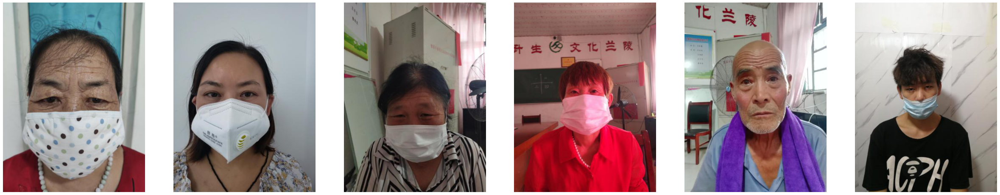

In [7]:
fig, ax = plt.subplots(1, 6, figsize=(42, 10))
for i, img in enumerate(img_list):
    plt.subplot(1,6,i+1)
    plt.axis('off')
    ax[0].set_title(img)
    Image_file = Image.open(img)
    plt.imshow(Image_file)

#### 이미지 보여주는 함수 정의

In [9]:
def img_show(img_list):
    fig, ax = plt.subplots(1, 6, figsize=(42, 10))
    for i, img in enumerate(img_list):
        plt.subplot(1,6,i+1)
        plt.axis('off')
        ax[0].set_title(img)
        Image_file = Image.open(img)
        image = np.array(Image_file)
        transformed = transform(image=image)['image']
        plt.imshow(transformed)
    plt.show()


##### 사용 예시

아무렇게나 RandomCrop을 하면 얼굴이 잘리는 것을 확인할 수 있다.

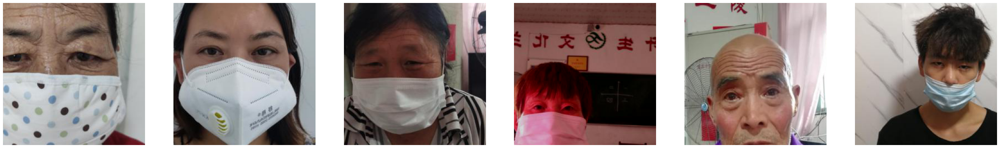

In [73]:
transform = A.Compose([
    A.RandomCrop(width=256, height=256),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.2),
])

img_show(img_list)

##### 1. Blur
##### 초점이 안 맞는 사진을 만들고 싶다면, blur처리를 하는게 좋다고 생각합니다. 아래는 (3, 9) 사용

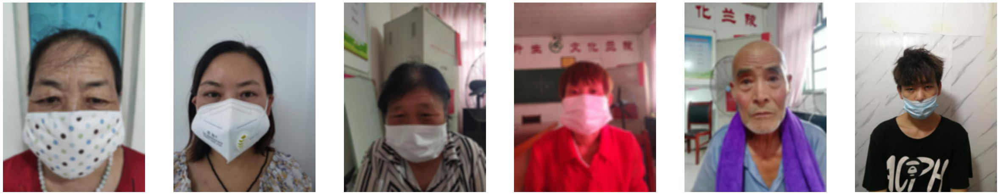

In [90]:
transform = A.Compose([
    A.Blur(always_apply=False, p=1.0, blur_limit=(3, 9))
    # p (default=0.5)
    # # blur_limit(int, (int, int)) default=(3, 7). kernel size를 의미하고 왼쪽 숫자는 최소 3이어야 합니다.
])

img_show(img_list)

##### 2. CLAHE
grid size마다 contrast 변환을 주는 듯 합니다. 굳이 사용해야할까 싶습니다.

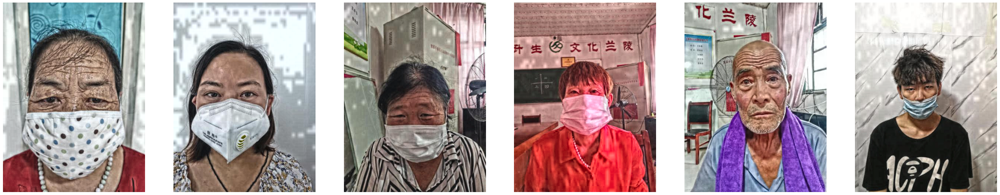

In [92]:
transform = A.Compose([
    A.CLAHE(always_apply=False, p=1.0, clip_limit=(1, 4), tile_grid_size=(50, 50))
    # clip_limit : contrast limit 값
    # tilt_grid_size : 
])

img_show(img_list)

## 3. Crop 계열
#### center crop
#### crop
#### RandomCrop
#### RandomResizedCrop

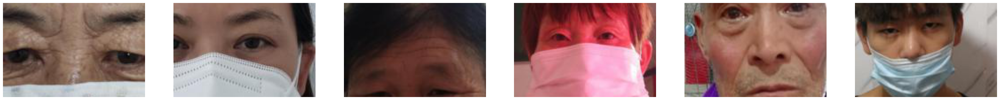

In [95]:
transform = A.Compose([
    A.CenterCrop(always_apply=False, p=1.0, height=106, width=160)
    # 가운데 기준으로 height * width 크기로 잘라냄
])

img_show(img_list)

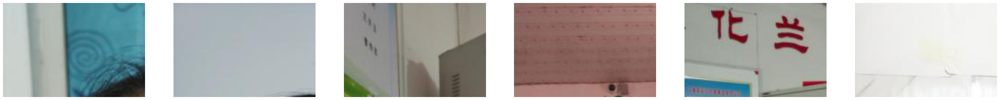

In [96]:
transform = A.Compose([
    A.Crop(always_apply=False, p=1.0, x_min=0, y_min=0, x_max=160, y_max=106)
    # xmin~xmax, ymin~ymax size crop
])

img_show(img_list)

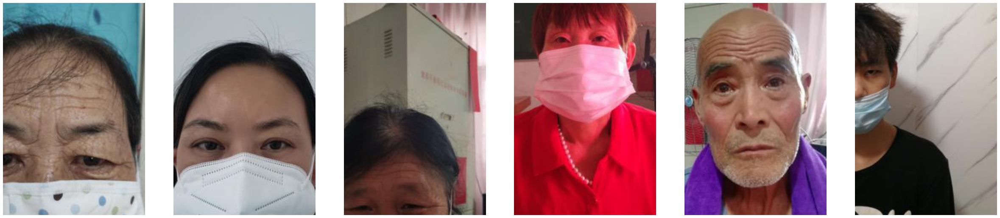

In [135]:
transform = A.Compose([
    A.RandomCrop(always_apply=False, p=1.0, width=200, height=300)
    # width * height size random crop
])

img_show(img_list)

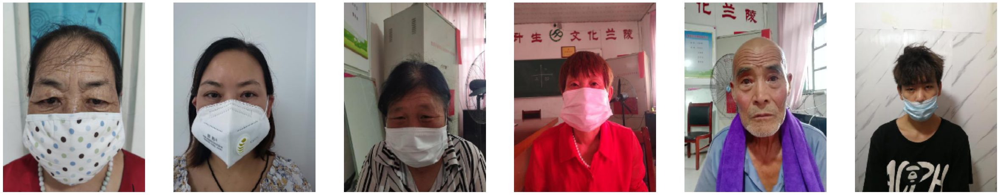

In [145]:
transform = A.Compose([
    A.RandomResizedCrop(always_apply=True, p=1.0, height=256, width=192, scale=(0.85, 1), ratio=(0.8, 2), interpolation=0)
    # 작동 방식의 이해 : ratio에 해당하는 만큼 사진을 조정하고 scale에 해당하는 만큼의 면적을 잘라냄. 그리고 height * width size 로 resize
    # 솔직히 잘 이해 안됨. 차라리 같은 기능을 하는 여러 함수로 만드는 게 직관적이고 쉬울 듯.
    # resize=>crop=>resize
    
    # height & width size
    # scale
    # ratio = 클 수록 위로 길어진 사진
    # interpolation 보간법 종류 설정: cv2.INTER_NEAREST, cv2.INTER_LINEAR(default), cv2.INTER_CUBIC, cv2.INTER_AREA, cv2.INTER_LANCZOS4.

    # 예를 들어 height=512, width=384, scale=(0.6, 0.8), ratio=(2, 3)
    # 사진을 세로로 2~3배로 늘리고, 그 사진 면적중 60~80%를 잘라 512*384 로 resize.
    # ratio=(0.8, 1.8), scale=(0.85, 1) 
])

img_show(img_list)

### Channel Shuffle
##### 의미있는 변환인지는 모르겠습니다.

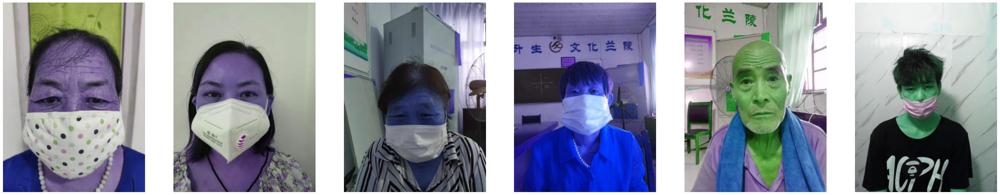

In [11]:
transform = A.Compose([
    A.ChannelShuffle(always_apply=False, p=1.0)
    # 채널 셔플
])

img_show(img_list)

## Coarse Dropout

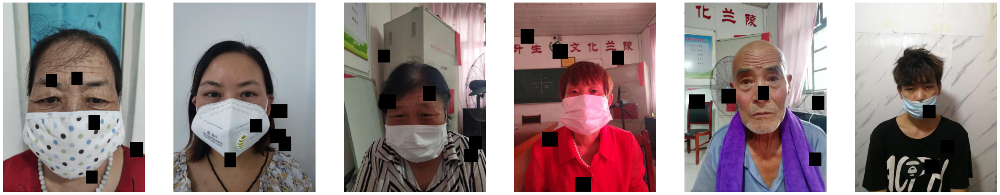

In [15]:
transform = A.Compose([
    A.CoarseDropout(always_apply=False, p=1.0, max_holes=5, max_height=40, max_width=45, min_holes=3, min_height=35, min_width=30)
    # min_holes, max_holes : zero out 될 영역의 개수 설정
    # max_height, min_height, max_width, min_width : zero out 될 영역의 크기 설정
])

img_show(img_list)

## Cutout
#### CoarseDropout과 다르게 fill_value를 통해 색을 채워 넣을 수 있음

/opt/conda/lib/python3.8/site-packages/albumentations/augmentations/transforms.py:689: FutureWarning: This class has been deprecated. Please use CoarseDropout
  warnings.warn(


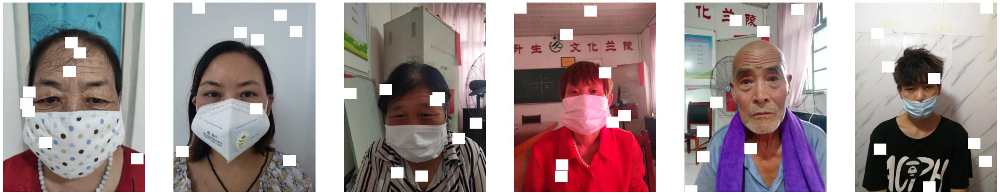

In [17]:
transform = A.Compose([
    A.Cutout(always_apply=False, p=1.0, num_holes=8, max_h_size=30, max_w_size=34, fill_value=([255,255,255]))
    # num_holes : drop out 될 영역의 개수 설정
    # max_h_size, max_w_size : zero out 될 영역의 크기 설정
    # fill_value : 넣을 색
])
    
img_show(img_list)

## DownScale

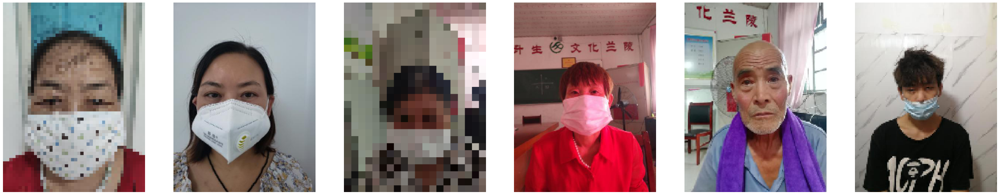

In [18]:
transform = A.Compose([
    A.Downscale(always_apply=False, p=1.0, scale_min=0.3, scale_max=0.6, interpolation=0)
    # scale_min(<1) : image scale 최소값(작을 수록 모자이크 효과가 커짐)
    # scale_max : 최대값(1에 가까울 수록 원본에 가까워짐)
])

img_show(img_list)